In [5]:
import gymnasium as gym
import numpy as np
import random
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

#### O Gymnasium, *aka* gym, é uma biblioteca derivada da gym do grupo OpenAI. Ela consiste em uma API que simula diversos ambientes de controle, jogos, ambientes 3D, etc... para que usuários possam aplicar técnicas de *Reinforcement Learning*

#### O objetivo desta prática é implementar uma solução de **Aprendizado por Reforço** para o *Cart Pole* que consiste em:
* Manter o pêndulo invertido orientado para cima - o ângulo do poste não deve ultrapassar o intervalo [-.2095, .2095] radianos
* O vagão deve se manter no trilho - sua posição em X deve se manter no intervalo [-2.4, 2.4]

#### Primeiramente vamos criar um ambiente do 'CartPole-v1', iniciar com o método reset() e interagir com o ambiente com alguns passos aleatórios. 

<hr>

# *Cart Pole*
* https://gymnasium.farama.org/environments/classic_control/cart_pole/

In [6]:
env = gym.make('CartPole-v1', render_mode="rgb_array")
_ = env.reset()
frames = []
actions, rewards = [], []
done = False

while not done:
    frames.append(env.render())
    action = env.action_space.sample() 
    state, reward, done, _, _ = env.step(action)
    actions.append(action)
    rewards.append(reward)

round4 = lambda x: round(x, 4)
print("Ações aleatorias:", actions, "\nRecompensa Imediata:", rewards, sep='\n')
print('\nEstado final:', 'Cart Position    |   Cart Velocity   |   Pole Angle  |   Pole Angular Velocity', sep='\n')
print(*map(round4, state), sep=" "*16)

Ações aleatorias:
[0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1]

Recompensa Imediata:
[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

Estado final:
Cart Position    |   Cart Velocity   |   Pole Angle  |   Pole Angular Velocity
0.1889                0.8143                -0.217                -1.3061


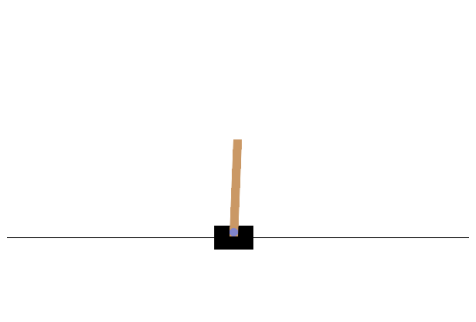

In [7]:
def display_frames_as_gif(frames):

    plt.ioff()
    aspect = 72
    fig, ax = plt.subplots(figsize=(frames[0].shape[1] / aspect, frames[0].shape[0] / aspect), dpi=aspect)
    patch = ax.imshow(frames[0])
    _ = plt.axis('off')

    def animate(i):
        patch.set_data(frames[i])

    anim = animation.FuncAnimation(fig, animate, frames=len(frames), interval=50, )
    return anim

anim = display_frames_as_gif(frames)
HTML(anim.to_jshtml())

# Sua implementação do *CartPole*

In [8]:
env = gym.make('CartPole-v1', render_mode = 'rgb_array')

# Q-learning parameters
alpha = 0.1  
gamma = 0.99  

epsilon_zero = 1.0 #TODO  # valor inicial de epsilon
epsilon_min = 0.0 #TODO  # valor final de epsilon
episodes = 150000 #TODO  # Numero maximo de episodios do treinamento. MAXIMO PERMITIDO 250_000
min_epsilon_episode = 100000 #TODO #Episodio que o epsilon mínimo é atingido

max_steps = 500  # Número máximo de passos no treinamento. Fixo! 
epsilon = epsilon_zero
epsilon_decay =  -1e-5 # (epsilon_min - epsilon) / min_epsilon_episode  # Decaimento Linear do Epsilon, PERMITIDO ALTERAÇÕES
print(f"{epsilon} {epsilon_decay}")

1.0 -1e-05


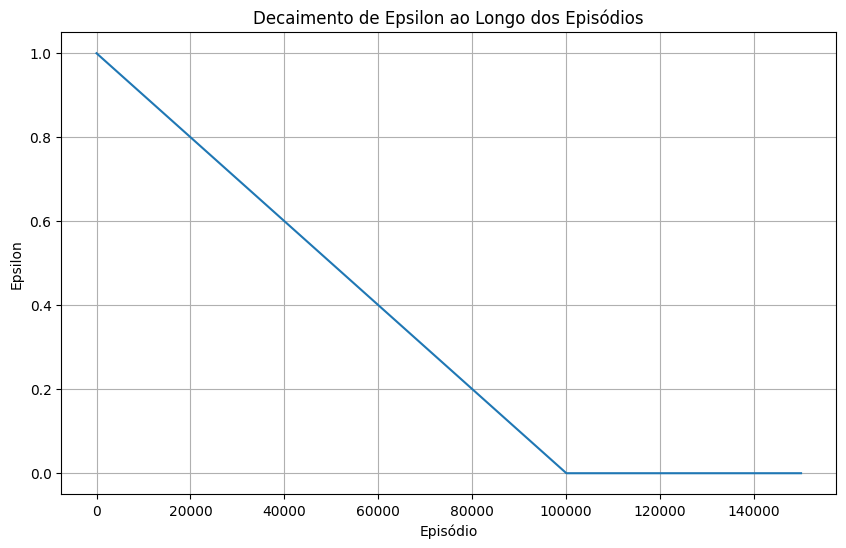

In [9]:
#TODO
# Faça um plot da variação de epsilon durante o decorrer de 'episodes'

epsilon_values = []
aux = epsilon
# Calcula o valor de epsilon para cada episódio
for episode in range(episodes):
    if episode < min_epsilon_episode:
        aux += epsilon_decay
    else:
        aux = epsilon_min
    epsilon_values.append(aux)

# Plot do decaimento de epsilon
plt.figure(figsize=(10, 6))
plt.plot(epsilon_values)
plt.title('Decaimento de Epsilon ao Longo dos Episódios')
plt.xlabel('Episódio')
plt.ylabel('Epsilon')
plt.grid(True)
plt.show()


In [10]:
# Define the bins for each state variable
n_bins = 20 #TODO Escolha um número de estados para cada variável
bins = [
    np.linspace(-4.8, 4.8, n_bins), #Cart Position
    np.linspace(-4, 4, n_bins), #Cart Velocity
    np.linspace(-0.418, 0.418, n_bins), #Pole Angle
    np.linspace(-4, 4, n_bins) #Pole Angular Velocity
]
def discretize_state(state, bins):
    """ 
        As variaveis do CartPole originalmente são contínuas. Discretize.
        Implemente a função discretize_state(state, bins) -> state_discretized
            state: list | tuple = Estado do vagão
            bins: Lista com as discretizações

            return state_discretized: tuple = Estados discretizados
    """
    state_discretized = []
    for i in range(len(state)):
        # np.digitize retorna o índice do bin ao qual o valor pertence
        discretized_value = np.digitize(state[i], bins[i]) - 1
        state_discretized.append(discretized_value)
    return tuple(state_discretized)

# Inicialização da Q-table
state_space_size = tuple([len(bins[i]) + 1 for i in range(len(bins))])
action_space_size = env.action_space.n
Q = np.zeros(state_space_size + (action_space_size,))

In [11]:
print(Q.shape)

(21, 21, 21, 21, 2)


In [12]:
def choose_action(state, Q, epsilon):
    """
        Implemente a função choose_action(state, Q, epsilon)
        Escolha de forma probabilística conforme epsilon entre uma ação aleatória ou uma ação ótima
    """
    if np.random.rand() < epsilon:
        # Escolhe uma ação aleatória (exploração)
        action = np.random.choice(range(Q.shape[-1]))
    else:
        # Escolhe a melhor ação conhecida (exploração)
        action = np.argmax(Q[state])
    return action

def update_q_table(Q, state, action, reward, next_state, alpha, gamma):
    """
        Faça a atualização da Q-table conforme formulação do RL
    """
    # Valor Q atual
    current_q = Q[state][action]

    # Melhor valor Q para o próximo estado
    best_next_q = np.max(Q[next_state])

    # Fórmula de atualização do Q-learning
    new_q = current_q + alpha * (reward + gamma * best_next_q - current_q)

    # Atualiza a tabela Q
    Q[state][action] = new_q

In [13]:
#Treinamento da Q-table
rewards = []
for episode in range(episodes):
    state, _ = env.reset()
    state = discretize_state(state, bins)
    total_reward = 0

    for step in range(max_steps):
        action = choose_action(state, Q, epsilon)
        next_state, reward, done, truncated, _ = env.step(action)
        next_state = discretize_state(next_state, bins)

        update_q_table(Q, state, action, reward, next_state, alpha, gamma)

        state = next_state
        total_reward += reward
        rewards.append(total_reward)
        if done:
            break

    print(f"Episode {episode + 1}: Total Reward = {total_reward}, epislon = {epsilon}")
    # Decay epsilon
    if epsilon > epsilon_min:
        epsilon = epsilon_decay*episode + epsilon_zero


print("Training finished.\n")

Episode 1: Total Reward = 14.0, epislon = 1.0
Episode 2: Total Reward = 24.0, epislon = 1.0
Episode 3: Total Reward = 17.0, epislon = 0.99999
Episode 4: Total Reward = 19.0, epislon = 0.99998
Episode 5: Total Reward = 55.0, epislon = 0.99997
Episode 6: Total Reward = 13.0, epislon = 0.99996
Episode 7: Total Reward = 16.0, epislon = 0.99995
Episode 8: Total Reward = 13.0, epislon = 0.99994
Episode 9: Total Reward = 17.0, epislon = 0.99993
Episode 10: Total Reward = 21.0, epislon = 0.99992
Episode 11: Total Reward = 29.0, epislon = 0.99991
Episode 12: Total Reward = 15.0, epislon = 0.9999
Episode 13: Total Reward = 13.0, epislon = 0.99989
Episode 14: Total Reward = 15.0, epislon = 0.99988
Episode 15: Total Reward = 24.0, epislon = 0.99987
Episode 16: Total Reward = 25.0, epislon = 0.99986
Episode 17: Total Reward = 14.0, epislon = 0.99985
Episode 18: Total Reward = 14.0, epislon = 0.99984
Episode 19: Total Reward = 29.0, epislon = 0.99983
Episode 20: Total Reward = 12.0, epislon = 0.9998

Episode 183: Total Reward = 13.0, epislon = 0.99819
Episode 184: Total Reward = 33.0, epislon = 0.99818
Episode 185: Total Reward = 11.0, epislon = 0.99817
Episode 186: Total Reward = 22.0, epislon = 0.99816
Episode 187: Total Reward = 12.0, epislon = 0.99815
Episode 188: Total Reward = 32.0, epislon = 0.99814
Episode 189: Total Reward = 18.0, epislon = 0.99813
Episode 190: Total Reward = 26.0, epislon = 0.99812
Episode 191: Total Reward = 25.0, epislon = 0.99811
Episode 192: Total Reward = 22.0, epislon = 0.9981
Episode 193: Total Reward = 15.0, epislon = 0.99809
Episode 194: Total Reward = 15.0, epislon = 0.99808
Episode 195: Total Reward = 22.0, epislon = 0.99807
Episode 196: Total Reward = 14.0, epislon = 0.99806
Episode 197: Total Reward = 13.0, epislon = 0.99805
Episode 198: Total Reward = 71.0, epislon = 0.99804
Episode 199: Total Reward = 16.0, epislon = 0.99803
Episode 200: Total Reward = 25.0, epislon = 0.99802
Episode 201: Total Reward = 17.0, epislon = 0.99801
Episode 202: 

In [34]:
plt.figure(figsize=(200, 10))
plt.plot(rewards)
plt.xlabel('Episódios')
plt.ylabel('Recompensa')
plt.title('Recompensa ao longo dos Episódios')
plt.show()

In [15]:
frames = []

state, _ = env.reset()
state = discretize_state(state, bins)
total_reward = 0

for step in range(max_steps):
    
    frames.append(env.render())

    action = np.argmax(Q[state])
    next_state, reward, done, truncated, _  = env.step(action)
    next_state = discretize_state(next_state, bins)

    state = next_state
    total_reward += reward
    
    if done:
        break

print(f"Test Episode {episode + 1}: Total Reward = {total_reward}")

Test Episode 150000: Total Reward = 500.0


In [16]:
anim = display_frames_as_gif(frames)
HTML(anim.to_jshtml())

In [19]:
# TODO implemente uma pertubação do cartpole e avalie o resultado
frames = []
angles = []
angle_vels = []
state, _ = env.reset()
angles.append(state[2])
angle_vels.append(state[3])
state = discretize_state(state, bins)
total_reward = 0
angles = []
angle_vels = []
for step in range(1, 605 + 1):
    
    frames.append(env.render())
    if(step >=  101 and step <= 105):
        action = 1
    else:
        action = np.argmax(Q[state])
    next_state, reward, done, truncated, _  = env.step(action)
    angles.append(next_state[2])
    angle_vels.append(next_state[3])
    next_state = discretize_state(next_state, bins)

    state = next_state
    total_reward += reward
    
    if done:
        print("Done")
        break

print(f"Test Episode {episode + 1}: Total Reward = {total_reward}")


Test Episode 150000: Total Reward = 605.0


In [20]:
anim = display_frames_as_gif(frames)
HTML(anim.to_jshtml())

[-0.0024985014, 0.0031670213, 0.014670421, 0.0320474, 0.043663688, 0.04963162, 0.050027583, 0.044891145, 0.045915376, 0.041375842, 0.042972416, 0.03898205, 0.029415214, 0.025942577, 0.016804736, 0.013681816, 0.01651763, 0.025292797, 0.04002484, 0.049064543, 0.052508198, 0.05041565, 0.042809796, 0.041366804, 0.034346316, 0.033434525, 0.026889704, 0.026405608, 0.020239932, 0.0200921, 0.025924258, 0.026030835, 0.020449571, 0.020883866, 0.027299447, 0.027994536, 0.023010703, 0.024054466, 0.019391531, 0.020732043, 0.028047305, 0.029641079, 0.02556078, 0.015816737, 0.012085252, 0.014306372, 0.022456914, 0.02484469, 0.021522177, 0.012504811, 0.009475217, 0.012377653, 0.02119323, 0.024233697, 0.03326002, 0.03658741, 0.03427465, 0.026343504, 0.024478141, 0.016927648, 0.015383142, 0.019798141, 0.018457318, 0.023093756, 0.02199411, 0.015188302, 0.014373226, 0.019506872, 0.018878216, 0.024225026, 0.02383845, 0.017753026, 0.017669696, 0.023550985, 0.02369111, 0.01812803, 0.018566148, 0.024971206, 0

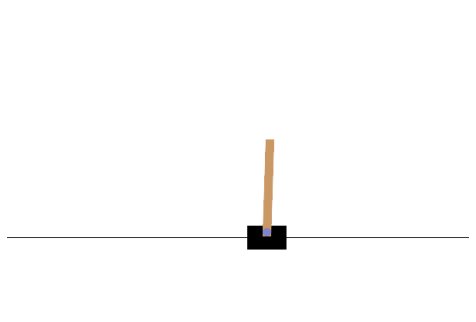

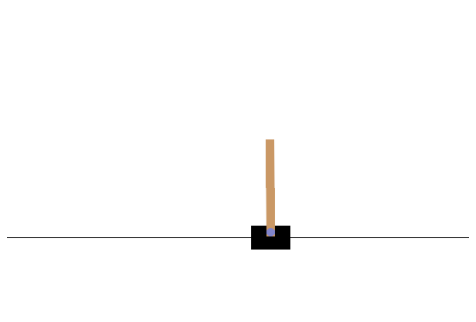

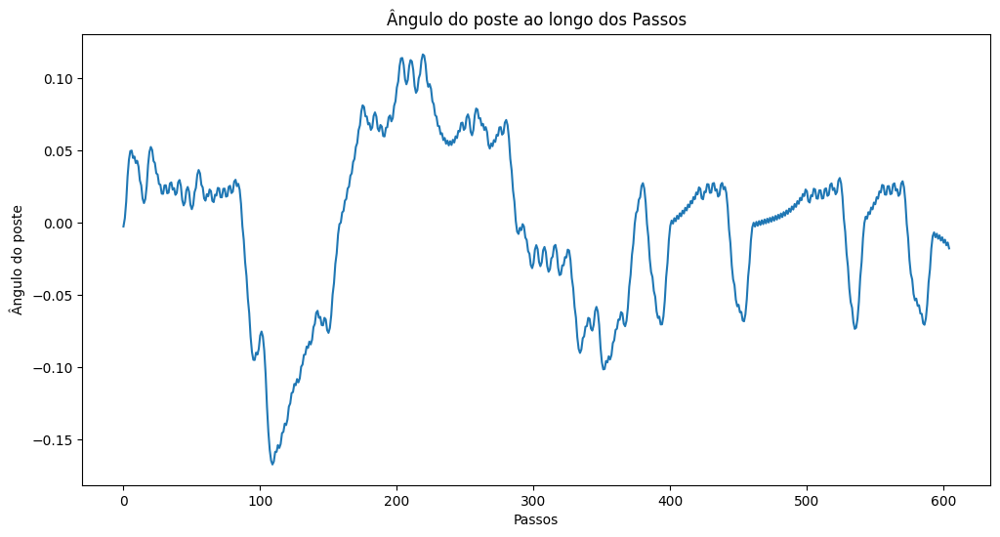

In [21]:
print(angles)
plt.figure(figsize=(12, 6))
plt.plot(angles)
plt.xlabel('Passos')
plt.ylabel('Ângulo do poste')
plt.title('Ângulo do poste ao longo dos Passos')
plt.show()

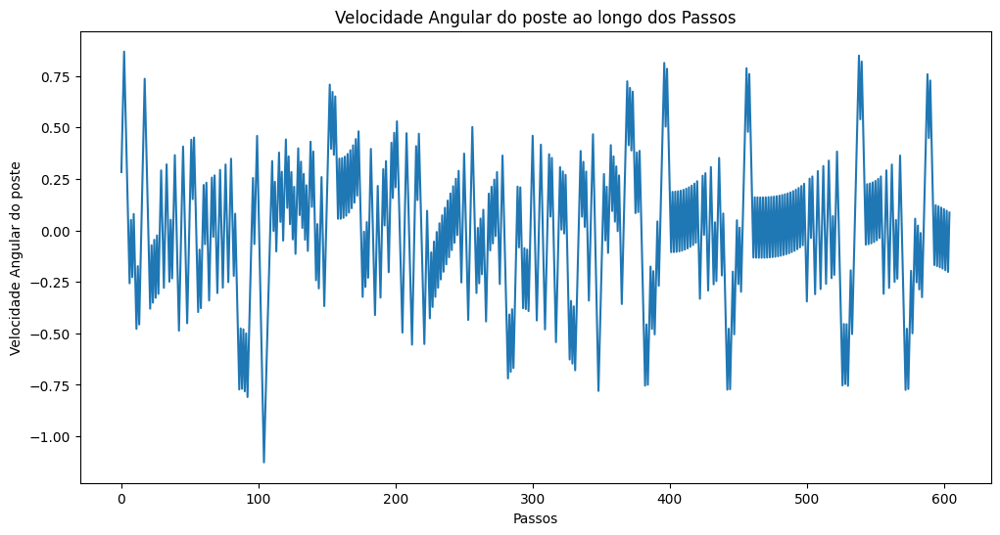

In [22]:
plt.figure(figsize=(12, 6))
plt.plot(angle_vels)
plt.xlabel('Passos')
plt.ylabel('Velocidade Angular do poste')
plt.title('Velocidade Angular do poste ao longo dos Passos')
plt.show()

In [29]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam

# Criando o ambiente
env = gym.make('CartPole-v1')

# Definindo o modelo da rede neural
model = Sequential()
model.add(Dense(24, input_dim=4, activation='relu'))
model.add(Dense(24, activation='relu'))
model.add(Dense(2, activation='linear'))
model.compile(loss='mse', optimizer=Adam(learning_rate=0.001))

# Função para escolher a ação
def choose_action(state, epsilon):
    if np.random.rand() <= epsilon:
        return np.random.choice([0, 1])
    q_values = model.predict(state)
    return np.argmax(q_values[0])

# Função para atualizar a Q-table (Q-learning)
def update_q_table(state, action, reward, next_state, done, gamma):
    target = reward
    if not done:
        target += gamma * np.amax(model.predict(next_state)[0])
    target_f = model.predict(state)
    target_f[0][action] = target
    model.fit(state, target_f, epochs=1, verbose=0)

# Parâmetros de treinamento
epsilon = 1.0  # Epsilon inicial
epsilon_min = 0.1
epsilon_decay = 0.995
gamma = 0.95  # Fator de desconto
episodes = 2000

# Loop de treinamento
for e in range(episodes):
    state, _ = env.reset()
    state = np.reshape(state, [1, 4])
    for time in range(500):
        action = choose_action(state, epsilon)
        next_state, reward, done, _, _ = env.step(action)
        reward = reward if not done else -10
        next_state = np.reshape(next_state, [1, 4])
        update_q_table(state, action, reward, next_state, done, gamma)
        state = next_state
        if done:
            print(f"Episode {e+1}/{episodes}, Score: {time}, Epsilon: {epsilon:.2f}")
            break
    if epsilon > epsilon_min:
        epsilon *= epsilon_decay

/scratch/raularaju/miniconda3/envs/TP2_IA/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


[-0.03741092  0.0477954  -0.00365448 -0.04937907]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step

2024-07-30 15:52:36.751850: W tensorflow/core/data/root_dataset.cc:362] Optimization loop failed: CANCELLED: Operation was cancelled


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Episode 51/2000, Score: 37, Epsilon: 0.78
[0.04375296 0.01045504 0.04321587 0.00069386]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


2024-07-30 15:55:39.306322: W tensorflow/core/data/root_dataset.cc:362] Optimization loop failed: CANCELLED: Operation was cancelled


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━

2024-07-30 16:04:34.134893: W tensorflow/core/data/root_dataset.cc:362] Optimization loop failed: CANCELLED: Operation was cancelled


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━

2024-07-30 16:09:53.906846: W tensorflow/core/data/root_dataset.cc:362] Optimization loop failed: CANCELLED: Operation was cancelled


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━

2024-07-30 16:21:33.796840: W tensorflow/core/data/root_dataset.cc:362] Optimization loop failed: CANCELLED: Operation was cancelled


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━

KeyboardInterrupt: 

In [30]:
frames = []

state, _ = env.reset()
state = discretize_state(state, bins)
total_reward = 0

for step in range(max_steps):
    
    frames.append(env.render())

    action = np.argmax(Q[state])
    next_state, reward, done, truncated, _  = env.step(action)
    next_state = discretize_state(next_state, bins)

    state = next_state
    total_reward += reward
    
    if done:
        break

print(f"Test Episode {episode + 1}: Total Reward = {total_reward}")

Test Episode 150000: Total Reward = 500.0


/scratch/raularaju/miniconda3/envs/TP2_IA/lib/python3.12/site-packages/gymnasium/envs/classic_control/cartpole.py:215: UserWarning: WARN: You are calling render method without specifying any render mode. You can specify the render_mode at initialization, e.g. gym.make("CartPole-v1", render_mode="rgb_array")
  gym.logger.warn(


In [32]:
print(frames)

[None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, Non

In [31]:
anim = display_frames_as_gif(frames)
HTML(anim.to_jshtml())

AttributeError: 'NoneType' object has no attribute 'shape'